In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
from pymongo import MongoClient
import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from talib import abstract

from functools import partial

In [2]:
#Download Data from yahoo
### TEST Scnarios - TCS- Bull ,ACC- modrate up (Sidewase),YESBank- Back to Zero ,ITC(stock dosnt even Move)
stock='YESBank'
startdate='2007-01-01'
enddate='2022-01-01'
exchange=['.NS','.BO']
dfo = yf.download(stock+exchange[0],start=startdate)

[*********************100%***********************]  1 of 1 completed


In [3]:
def hla(df,days):
    for day in days:
        df[f'{day}High']=df['High'].rolling(day).max()
        df[f'{day}Low']=df['Low'].rolling(day).min()
        df[f'{day}Avg']=((df['High']+df['Close'])/2).rolling(day).mean()
        df[f'{day}%High']=(df[f'{day}High']/df[f'{day}Avg']-1)
        df[f'{day}%Low']=(df[f'{day}Low']/df[f'{day}Avg']-1)
        
    return df

In [4]:
def pos(df):
    df['Lpos']=0
    df['Hpos']=0
    last=0
    for i in df.index:
        if i !=df.index[5]:
            if ((df['Close'][i]<df['5Low'].shift(1)[i]) and (df['Close'].shift(1)[i]>df['5Low'].shift(1)[i])):
                df.at[i,'Lpos']=-5
                # last=-5
            if ((df['Close'][i]<df['10Low'].shift(1)[i]) and (df['Close'].shift(1)[i]>df['10Low'].shift(1)[i])):
                df.at[i,'Lpos']=-10
                last=-10
            if ((df['Close'][i]<df['21Low'].shift(1)[i]) and (df['Close'].shift(1)[i]>=df['21Low'].shift(1)[i])):
                df.at[i,'Lpos']=-21
                last=-21
            if ((df['Close'][i]<df['42Low'].shift(1)[i]) and (df['Close'].shift(1)[i]>=df['42Low'].shift(1)[i])):
                df.at[i,'Lpos']=-42
                last=-42
            if ((df['Close'][i]<df['63Low'].shift(1)[i]) & (df['Close'].shift(1)[i]>=df['63Low'].shift(1)[i])):
                df.at[i,'Lpos']=-63
                last=-63
            if ((df['Close'][i]<df['84Low'].shift(1)[i]) & (df['Close'].shift(1)[i]>=df['84Low'].shift(1)[i])):
                df.at[i,'Lpos']=-84
                last=-84
            if ((df['Close'][i]<df['105Low'].shift(1)[i]) & (df['Close'].shift(1)[i]>=df['105Low'].shift(1)[i])):
                df.at[i,'Lpos']=-105
                last=-105
            if ((df['Close'][i]<df['126Low'].shift(1)[i]) & (df['Close'].shift(1)[i]>=df['126Low'].shift(1)[i])):
                df.at[i,'Lpos']=-126
                last=-126
            if ((df['Close'][i]<df['189Low'].shift(1)[i]) & (df['Close'].shift(1)[i]>=df['189Low'].shift(1)[i])):
                df.at[i,'Lpos']=-189
                last=-189
            if ((df['Close'][i]<df['252Low'].shift(1)[i]) & (df['Close'].shift(1)[i]>=df['252Low'].shift(1)[i])) or(last==-252) :
                df.at[i,'Lpos']=-252
                last=-252
                
            if ((df['Close'][i]>df['5High'].shift(1)[i]) and (df['Close'].shift(1)[i]<=df['5High'].shift(1)[i])):
                df.at[i,'Hpos']=5
                # last=5
            if ((df['Close'][i]>df['10High'].shift(1)[i]) and (df['Close'].shift(1)[i]<=df['10High'].shift(1)[i])):
                df.at[i,'Hpos']=10
                last=10
            if ((df['Close'][i]>df['21High'].shift(1)[i]) and (df['Close'].shift(1)[i]<=df['21High'].shift(1)[i])):
                df.at[i,'Hpos']=21
                last=21
            if ((df['Close'][i]>df['42High'].shift(1)[i]) and (df['Close'].shift(1)[i]<=df['42High'].shift(1)[i])):
                df.at[i,'Hpos']=42
                last=42
            if ((df['Close'][i]>df['63High'].shift(1)[i]) & (df['Close'].shift(1)[i]<=df['63High'].shift(1)[i])):
                df.at[i,'Hpos']=63
                last=63
            if ((df['Close'][i]>df['84High'].shift(1)[i]) & (df['Close'].shift(1)[i]<=df['84High'].shift(1)[i])):
                df.at[i,'Hpos']=84
                last=84
            if ((df['Close'][i]>df['105High'].shift(1)[i]) & (df['Close'].shift(1)[i]<=df['105High'].shift(1)[i])):
                df.at[i,'Hpos']=105
                last=105
            if ((df['Close'][i]>df['126High'].shift(1)[i]) & (df['Close'].shift(1)[i]<=df['126High'].shift(1)[i])):
                df.at[i,'Hpos']=126
                last=126
            if ((df['Close'][i]>df['189High'].shift(1)[i]) & (df['Close'].shift(1)[i]<=df['189High'].shift(1)[i])):
                df.at[i,'Hpos']=189 
                last=189
            if ((df['Close'][i]>df['252High'].shift(1)[i]) & (df['Close'].shift(1)[i]<=df['252High'].shift(1)[i]))or(last== 252):
                df.at[i,'Hpos']=252
                last=252
    # df.replace(to_replace=0,method='ffill',inplace=True)

    return df

In [5]:
## Making Copy of Dataframe for further analysis and changes
df=dfo.copy()
# Adding feild called % Daily changes out of 100%
df['pct_change']=(df['Close'].pct_change())*100
df.dropna(inplace=True)


days=[5,10,21,42,63,84,105,126,189,252]
df4=hla(df,days)
df4.dropna(inplace=True)
df4=pos(df4)

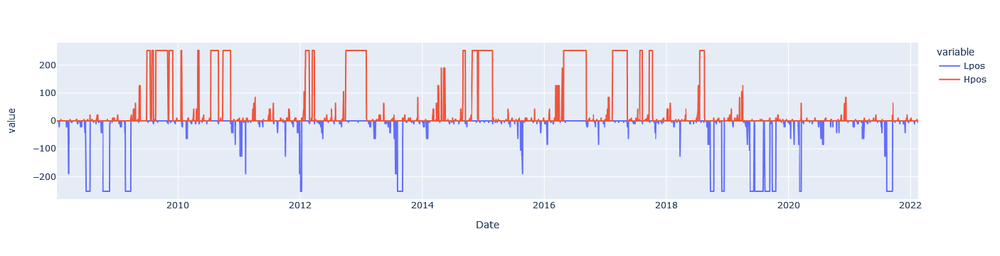

In [6]:
fig=px.line(df4[['Lpos','Hpos']])
fig.show()

In [7]:
def count_days(df):
    count=1
    df['Lpos_days']=0
    for i in df.index:
        if df['Lpos'][i]==df['Lpos'].shift(1)[i]:
            count +=1
        else:
            count=1
        df.at[i,'Lpos_days']=count
    return df
        
    

In [44]:
def hldiff(df):
    windows=[5,10,21,42,63,84,105,126,189,252]
    for window in windows:
        if df[str(window)+'High'][0]:
            df[str(window)+'hldiff']=np.log(df[str(window)+'High'])-np.log(df[str(window)+'Low'])
                   
            df[str(window)+'lhdiff']=np.log(df[str(window)+'Low'])-np.log(df[str(window)+'High'])
         
    return df
        

In [8]:
df4=count_days(df4)

In [47]:
df4=hldiff(df4)

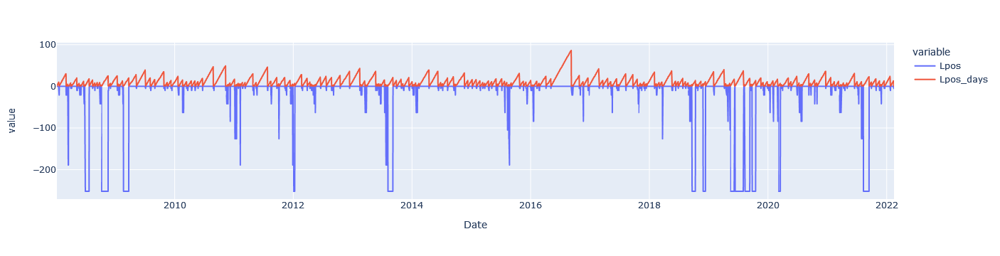

In [9]:
fig=px.line(df4[['Lpos','Lpos_days']])
fig.show()

In [10]:
print(f" Maximum consicutive days below 252 are : {np.max(df4.loc[df['Lpos']==-252]['Lpos_days'])}")
print(f" Average consicutive days below 252 are :{np.mean(df4.loc[df['Lpos']==-252]['Lpos_days'])}")
print(f" SD days below 252 is :{np.std(df4.loc[df['Lpos']==-252]['Lpos_days'])}")
print(f" Min Days to wait to Enter in trade when Close below Low of 252 Days are :{np.ceil(round(np.mean(df4.loc[df['Lpos']==-252]['Lpos_days'])+np.std(df4.loc[df['Lpos']==-252]['Lpos_days']),2))}")


 Maximum consicutive days below 252 are : 37
 Average consicutive days below 252 are :11.120171673819742
 SD days below 252 is :7.743926096421449
 Min Days to wait to Enter in trade when Close below Low of 252 Days are :19.0


In [11]:
df4.shape

(3477, 60)

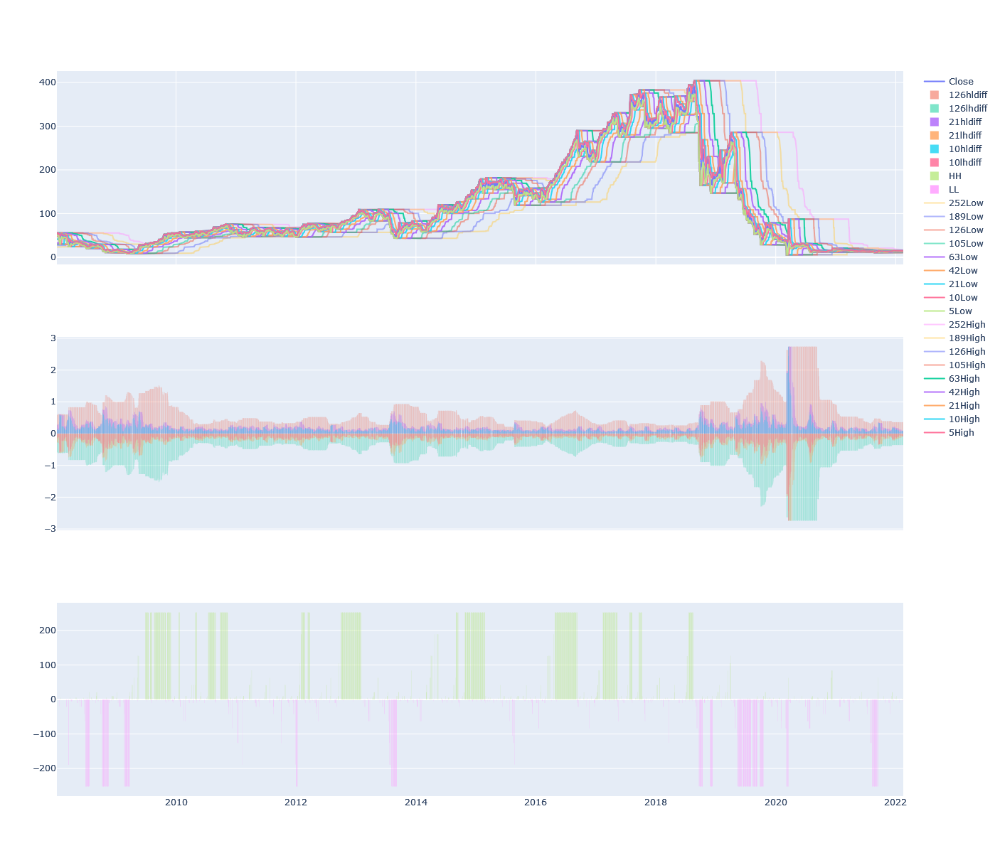

In [51]:
fig = make_subplots(rows=3, cols=1,shared_xaxes=True)
trace1 = go.Scatter(x=df4.index,y=df4['Close'],name='Close',mode='lines',opacity=0.9)
trace2 = go.Bar(x=df4.index,y=df4['126hldiff'],name='126hldiff',opacity=0.5)
trace3 = go.Bar(x=df4.index,y=df4['126lhdiff'],name='126lhdiff',opacity=0.5)
trace4 = go.Bar(x=df4.index,y=df4['21hldiff'],name='21hldiff',opacity=0.8)
trace5 = go.Bar(x=df4.index,y=df4['21lhdiff'],name='21lhdiff',opacity=0.8)
trace4a = go.Bar(x=df4.index,y=df4['10hldiff'],name='10hldiff',opacity=0.8)
trace5a = go.Bar(x=df4.index,y=df4['10lhdiff'],name='10lhdiff',opacity=0.8)

trace7 = go.Scatter(x=df4.index,y=df4['252Low'],name='252Low',mode='lines',opacity=0.5)
trace8 = go.Scatter(x=df4.index,y=df4['189Low'],name='189Low',mode='lines',opacity=0.5)
trace9 = go.Scatter(x=df4.index,y=df4['126Low'],name='126Low',mode='lines',opacity=0.5)
trace10 = go.Scatter(x=df4.index,y=df4['105Low'],name='105Low',mode='lines',opacity=0.5)
trace11 = go.Scatter(x=df4.index,y=df4['63Low'],name='63Low',mode='lines',opacity=0.9)
trace12 = go.Scatter(x=df4.index,y=df4['42Low'],name='42Low',mode='lines',opacity=0.9)
trace13 = go.Scatter(x=df4.index,y=df4['21Low'],name='21Low',mode='lines',opacity=0.9,)
trace14 = go.Scatter(x=df4.index,y=df4['10Low'],name='10Low',mode='lines',opacity=0.9,)
trace15 = go.Scatter(x=df4.index,y=df4['5Low'],name='5Low',mode='lines',opacity=0.9,)

trace17 = go.Scatter(x=df4.index,y=df4['252High'],name='252High',mode='lines',opacity=0.5)
trace18 = go.Scatter(x=df4.index,y=df4['189High'],name='189High',mode='lines',opacity=0.5)
trace19 = go.Scatter(x=df4.index,y=df4['126High'],name='126High',mode='lines',opacity=0.5)
trace20 = go.Scatter(x=df4.index,y=df4['105High'],name='105High',mode='lines',opacity=0.5)
trace21 = go.Scatter(x=df4.index,y=df4['63High'],name='63High',mode='lines',opacity=0.9)
trace22 = go.Scatter(x=df4.index,y=df4['42High'],name='42High',mode='lines',opacity=0.9)
trace23 = go.Scatter(x=df4.index,y=df4['21High'],name='21High',mode='lines',opacity=0.9,)
trace24 = go.Scatter(x=df4.index,y=df4['10High'],name='10High',mode='lines',opacity=0.9,)
trace25 = go.Scatter(x=df4.index,y=df4['5High'],name='5High',mode='lines',opacity=0.9,)

trace6 = go.Bar(x=df4.index,y=df4['Hpos'],name='HH',opacity=0.8)
trace16 = go.Bar(x=df4.index,y=df4['Lpos'],name='LL',opacity=0.8)

fig.append_trace(trace1, 1, 1)

fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 1)
fig.append_trace(trace4, 2, 1)
fig.append_trace(trace5, 2, 1)
fig.append_trace(trace4a, 2, 1)
fig.append_trace(trace5a, 2, 1)

fig.append_trace(trace6, 3, 1)
fig.append_trace(trace16, 3, 1)

fig.append_trace(trace7, 1, 1)
fig.append_trace(trace8, 1, 1)
fig.append_trace(trace9, 1, 1)
fig.append_trace(trace10, 1, 1)
fig.append_trace(trace11, 1, 1)
fig.append_trace(trace12, 1, 1)
fig.append_trace(trace13, 1, 1)
fig.append_trace(trace14, 1, 1)
fig.append_trace(trace15, 1, 1)

fig.append_trace(trace17, 1, 1)
fig.append_trace(trace18, 1, 1)
fig.append_trace(trace19, 1, 1)
fig.append_trace(trace20, 1, 1)
fig.append_trace(trace21, 1, 1)
fig.append_trace(trace22, 1, 1)
fig.append_trace(trace23, 1, 1)
fig.append_trace(trace24, 1, 1)
fig.append_trace(trace25, 1, 1)


fig.update_traces(dict(marker_line_width=0))
fig.update_layout(autosize=False,width=1200,height=1200,paper_bgcolor="white",barmode='overlay',hovermode="closest
                  
fig.show()

In [13]:
def backtester(start,end,init_df,trade_type,ma):
    bt=pd.DataFrame({'StartDate':start,'EndDate':end})
    bt.replace(to_replace=np.nan,value=0,inplace=True)
    
    dataframes=[]
    pc_=[]
    
    if trade_type=='long':
        
        for index in bt.index:
            init_df_tmp=(init_df.loc[(init_df.index>=bt['StartDate'][index]) & (init_df.index<=bt['EndDate'][index])]).copy()
            ## Setting up Default Variables
            pos=0
            num=0
            percentchange=[]
            day_count=0
            init_df_tmp['pos_days']=0
            init_df_tmp['s_daily_change']=0.0
            init_df_tmp['u_daily_Return']=0.0
            s_st=[]
            trigger_p=[]
            lastpc=[0,]
            
            s_start=0
            #### price at time of start date of this stratgy
            u_st=init_df_tmp['Close'][0]
            
            for i in init_df_tmp.index:
                CP=init_df_tmp['Close'][i]
                # Underline Daily return from the start date of Stratgy
                if s_start!=0:
                    init_df_tmp.at[i,'u_daily_Return']=init_df_tmp['pct_change'][i]
                
                if i != init_df_tmp.index[9]:##############3 Passing first 10 Days

                    #############Conditions######################
                    #############Long Position###################
                    long_condition=((init_df_tmp['Lpos'][i]> -252) & (init_df_tmp['Lpos'].shift(1)[i]==-252))       
                    #############Long SL/Exit#########################
                    long_exit= ((init_df_tmp['Lpos'][i]== -252) & (init_df_tmp['Lpos'].shift(1)[i]> -252)) 
                    
                    #############Short SL/Exit#########################
                
                  
                    ## Enter into Long
                    if not s_st:
                        if long_condition:                
                            if(pos==0):
                                print(f"Long Buy Triggred")
                                s_start=1
                                bp=CP
                                pos=1
                                print(f"Buying now at {str(bp)} on {i}")
                                init_df_tmp.at[i,'pos_days']=day_count
                                if not s_st: # to check if any long or short position already triggred or not. if s_st have value ,means already atleast one trade happned.
                                    s_st.append(bp)
                    if s_st:
                        if(pos==1):
                            day_count+=1
                            init_df_tmp.at[i,'pos_days']=day_count
                            init_df_tmp.at[i,'s_daily_change']=init_df_tmp['pct_change'][i]

                    ## Long SL/Exit       
                        if long_exit:                
                            if(pos==1):
                                print("Long Covering Triggred")
                                day_count=0
                                pos=0
                                sp=CP
                                print(f"Existing now at {str(sp)} on {i}")
                                pc=(sp/bp-1)*100
                                percentchange.append(pc)
                                init_df_tmp.at[i,'pos_days']=day_count
                                s_st.clear()


                        if(num==init_df_tmp["Close"].count()-1 and pos==1):
                            pos=0
                            sp=CP
                            day_count=0
                            print(f"Existing now at {str(sp)} on {i}")
                            pc=(sp/bp-1)*100
                            percentchange.append(pc)
                            init_df_tmp.at[i,'pos_days']=day_count
                            s_st.clear()


                num+=1    
                pc_.append(percentchange)

                #################################for Performance Matrix############
                # Stratgy Cummulative returns and Underline Cummulative returns
                init_df_tmp['scr']=((1+(init_df_tmp['s_daily_change']/100)).cumprod()-1)*100
                init_df_tmp['ucr']=((1+(init_df_tmp['u_daily_Return']/100)).cumprod()-1)*100        
                
                gains=0
                ng=0
                losses=0
                nl=0
                for i in percentchange:
                    if(i>0):
                        gains+=i
                        ng+=1
                    else:
                        losses+=i
                        nl+=1

                if(ng>0):
                    avgGain=gains/ng
                    maxR=max(percentchange)
                else:
                    avgGain=0
                    maxR=0

                if(nl>0):
                    avgLoss=losses/nl
                    maxL=min(percentchange)
                    ratio=-avgGain/avgLoss
                else:
                    avgLoss=0
                    maxL=0
                    ratio=999

                if(ng>0 or nl>0):
                    battingAvg=(ng/(ng+nl))*100
                else:
                    battingAvg=0
                ### Adding matrix to BackTEST Dataframe#####
                bt.at[index,'MA']=ma
                bt.at[index,'#Trades']=ng+nl
                bt.at[index,'Win avg']=round(battingAvg,2)
                bt.at[index,'#Wins']=ng
                bt.at[index,'#loss']=nl
                bt.at[index,'Gain/loss ratio']=round(ratio,2)
                bt.at[index,'Average Gain %']=round(avgGain,2)
                bt.at[index,'Average Loss %']=round(avgLoss,2)
                bt.at[index,'Max Return %']=round(maxR,2)
                bt.at[index,'Max Loss %']=round(maxL,2)
                bt.at[index,'Stratergy-Cum Total return %']=round(init_df_tmp['scr'][-1],2)
                bt.at[index,'Underline-Cum Total return %']=round(init_df_tmp['ucr'][-1],2)

                ## Adding Result Dataframe into List of Dataframes
                dataframes.append(init_df_tmp)
                
    return bt,dataframes

In [14]:
## Making Copy of Dataframe for further analysis and changes
df=dfo.copy()
# Adding feild called % Daily changes out of 100%
df['pct_change']=(df['Close'].pct_change())*100
df.dropna(inplace=True)


days=[5,10,21,42,63,84,105,126,189,252]
df4=hla(df,days)
df4.dropna(inplace=True)
df4=pos(df4)
df4=count_days(df4)

start=['2008-01-01']
end=['2022-01-01']
result,result_dataframes=backtester(start=start,end=end,init_df=df4,trade_type='long',ma=252)


Long Buy Triggred
Buying now at 26.459999084472656 on 2008-07-24 00:00:00
Long Covering Triggred
Existing now at 18.030000686645508 on 2008-10-08 00:00:00
Long Buy Triggred
Buying now at 13.449999809265137 on 2008-11-18 00:00:00
Long Covering Triggred
Existing now at 10.739999771118164 on 2009-02-20 00:00:00
Long Buy Triggred
Buying now at 9.970000267028809 on 2009-03-25 00:00:00
Long Covering Triggred
Existing now at 46.369998931884766 on 2012-01-02 00:00:00
Long Buy Triggred
Buying now at 54.459999084472656 on 2012-01-11 00:00:00
Long Covering Triggred
Existing now at 55.029998779296875 on 2013-08-06 00:00:00
Long Buy Triggred
Buying now at 58.59000015258789 on 2013-09-06 00:00:00
Long Covering Triggred
Existing now at 226.5 on 2018-09-21 00:00:00
Long Buy Triggred
Buying now at 246.4499969482422 on 2018-10-12 00:00:00
Long Covering Triggred
Existing now at 162.10000610351562 on 2018-11-28 00:00:00
Long Buy Triggred
Buying now at 174.6999969482422 on 2018-12-13 00:00:00
Long Covering

In [15]:
result

,StartDate,EndDate,MA,#Trades,Win avg,#Wins,#loss,Gain/loss ratio,Average Gain %,Average Loss %,Max Return %,Max Loss %,Stratergy-Cum Total return %,Underline-Cum Total return %
0,2008-01-01,2022-01-01,252.0,13.0,30.77,4.0,9.0,4.94,165.15,-33.46,365.1,-80.23,-81.33,-48.22


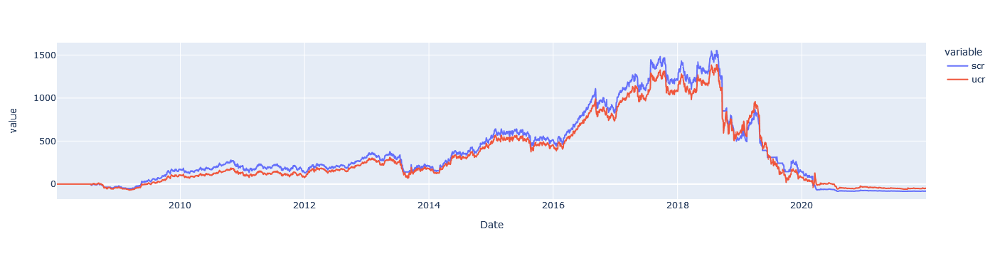

In [16]:
result_df=result_dataframes[0]
fig=px.line(result_df[['scr','ucr']],)
fig.show()